# Object Detection and Autopilot Safety analysis

## Part 1 : Object Detection

### Import libraries

In [1]:
import torch
import warnings
warnings.filterwarnings('ignore')
import os
import shutil
import pathlib
from glob import glob
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import numpy as np
import seaborn as sns

## Define the data paths

In [2]:


zip_file_path = '/content/drive/MyDrive/DL/od.zip'
data_root_colab = '/content/drive/MyDrive/DL/Object Detection'
data_root_kaggle = '.'
image_data_path_colab = '/content/drive/MyDrive/DL/Object Detection/Images'
image_data_path_kaggle = '/kaggle/input/object-detection/Object Detection/Images'
labels_path_kaggle = '/kaggle/input/object-detection/Object Detection/labels.csv'
labels_path_colab = f'{data_root_colab}/labels.csv'

image_data_path = None
data_root = None
labels_path = None


if os.path.exists(image_data_path_kaggle):
    image_data_path = image_data_path_kaggle
    data_root = data_root_kaggle
    labels_path = labels_path_kaggle
    print(f'Using Kaggle data ')
else:
   from google.colab import drive
   drive.mount('/content/drive')
   data_root = data_root_colab
   image_data_path = image_data_path_colab
   labels_path = labels_path_colab
   if not os.path.exists(image_data_path):
         from zipfile import ZipFile
         zip_ref = ZipFile(zip_file_path,'r')
         zip_ref.extractall('/content/drive/MyDrive/DL/')
         zip_ref.close()

   print(f'Using Google Drive data')
print(f'image data path is {image_data_path}')

print(f'labels path is at {labels_path}')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using Google Drive data
image data path is /content/drive/MyDrive/DL/Object Detection/Images
labels path is at /content/drive/MyDrive/DL/Object Detection/labels.csv


## Create the directory structure for yolo training

In [3]:
# create train , validation and test image directories
train_label_path = 'datasets/train/labels'
val_labels_path = 'datasets/val/labels'
train_image_path = 'datasets/train/images'
val_image_path = 'datasets/val/images'
test_image_path = 'datasets/test/images'

In [4]:
dirs = [train_label_path,val_labels_path,train_image_path,val_image_path,test_image_path]

for d in dirs:
    if os.path.exists(d):
        shutil.rmtree(d)
    os.makedirs(d)
    print(f'created {d}')

if not os.path.exists('datasets/data.yaml'):
    pathlib.Path.touch('datasets/data.yaml')

created datasets/train/labels
created datasets/val/labels
created datasets/train/images
created datasets/val/images
created datasets/test/images


In [5]:
%ls datasets

data.yaml  test/  train/  val/


## Load the labels csv file

In [6]:
import pandas as pd

label_data = pd.read_csv(labels_path,names=['id','name','x_min','y_min','x_max','y_max'])
label_data = label_data.drop_duplicates('id')
label_data['id'] = label_data['id'].astype(str).str.zfill(8)
label_data = label_data.iloc[0:len(os.listdir(image_data_path))]
label_data['image'] = sorted(os.listdir(image_data_path))
print(label_data.shape)
label_data.head()

(5626, 7)


,id,name,x_min,y_min,x_max,y_max,image
0,00000000,pickup_truck,213,34,255,50,00000000.jpg
5,00000001,bus,205,155,568,314,00000001.jpg
11,00000002,motorized_vehicle,334,362,603,479,00000002.jpg
12,00000003,car,480,99,511,120,00000003.jpg
14,00000004,bus,439,32,719,171,00000004.jpg


## Extimate Vehicle numbers

In [8]:
def copy_image_to_name(row):
  name = row['name']
  dest = f'{data_root}/image_root/{name}/'
  if os.path.exists(dest):
    shutil.copy(f'{image_data_path}/{row["image"]}',dest)
  else:
    os.makedirs(dest)
    shutil.copy(f'{image_data_path}/{row["image"]}',dest)
_=label_data.apply(copy_image_to_name,axis=1)

In [15]:
def get_subdirectories(directory) -> list:
    with os.scandir(directory) as entries:
        return [entry.name for entry in entries if entry.is_dir()]

def plot_class_numbers(directory,title) -> pd.DataFrame:
    '''
    Plots the number of images in each class
    :param directory: the directory containing the images
    :param title: the title of the plot
    :return: a dataframe containing the number of images in each class
    '''
    sub_dirs = get_subdirectories(directory)
    images = {}
    image_class = []
    num_images = []
    class_dict = {}

    for d in sub_dirs:
        image_class.append(d)
        num_images.append(len(os.listdir(str(directory)+'/'+d)))

    df = pd.DataFrame({'Image_Class':image_class,'Num_Images':num_images}).sort_values(by='Num_Images',ascending=True).reset_index()

    indices = sorted(df['index'].values.tolist())
    class_names = df['Image_Class'].values
    for i in indices:
      class_dict[i] = class_names[i]
    sns.barplot(data=df,x='Image_Class',y='Num_Images',palette=sns.mpl_palette('Dark2'))
    plt.xlabel('vehicle types')
    plt.title(f' {title}' )
    plt.xticks(rotation = 90)
    plt.gca().spines[['top', 'right',]].set_visible(False)
    plt.show()
    return df

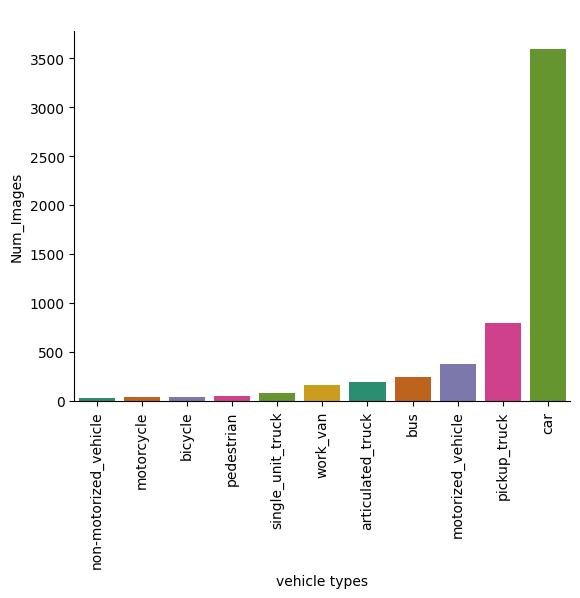

,index,Image_Class,Num_Images
0,7,non-motorized_vehicle,32
1,10,motorcycle,38
2,8,bicycle,43
3,6,pedestrian,56
4,9,single_unit_truck,80
5,5,work_van,161
6,4,articulated_truck,195
7,1,bus,244
8,2,motorized_vehicle,383
9,0,pickup_truck,801


In [16]:
plot_class_numbers(f'{data_root}/image_root','')

There is substantial class imbalance

## Create a map of vehicle types to index

In [11]:
import pprint
class_names = label_data.name.unique().tolist()
d = {}
for i in range(len(class_names)):
  d[class_names[i]] = i
pprint.pprint(d)

{'articulated_truck': 4,
 'bicycle': 8,
 'bus': 1,
 'car': 3,
 'motorcycle': 10,
 'motorized_vehicle': 2,
 'non-motorized_vehicle': 7,
 'pedestrian': 6,
 'pickup_truck': 0,
 'single_unit_truck': 9,
 'work_van': 5}


## Create labels for training and validation

In [17]:
import cv2
import numpy as np
import pathlib
def  get_label_filename(row):
   return row['id']+'.txt'

def normalize_bb(x_min,y_min,x_max,y_max,id):
   img_path = f'{image_data_path}/{id}.jpg'
   if  os.path.exists(img_path):
      img = cv2.imread(img_path)
      image_height,image_width,_ = img.shape
      x_center = (x_min + x_max)/2
      y_center = (y_min + y_max)/2
      width = x_max - x_min
      height = y_max - y_min
      normalized_x_center = x_center / image_width
      normalized_y_center = y_center / image_height
      normalized_width = width / image_width
      normalized_height = height / image_height
      return normalized_x_center, normalized_y_center,  normalized_width , normalized_height


def get_label_data(row):
  dims = normalize_bb(row['x_min'], row['y_min'],row['x_max'],row['y_max'],row['id'])
  class_id = d.get(row['name'])
  yolo_annotaion = f'{class_id} {dims[0]:.3f} {dims[1]:.3f} {dims[2]:.3f} {dims[0]:.3f}'
  return yolo_annotaion

def get_image_width(row):
     img_path = f"{image_data_path}/{row['id']}.jpg"
     img = cv2.imread(img_path)
     return img.shape[1]

def get_image_height(row):
     img_path = f"{image_data_path}/{row['id']}.jpg"
     img = cv2.imread(img_path)
     return img.shape[0]


def create_yaml():
  file_path = 'datasets/data.yaml'
  if os.path.exists(file_path):
    os.remove(file_path)

  train = 'train: train'
  val = 'val: val'
  nc = "nc: 11"
  names = f"names: {str(class_names)}"
  lines_to_append = [train,val,nc,names]

  try:
    with open(file_path, 'a') as file:
      for line in lines_to_append:
          file.write(f'{line}\n')
    print('data.yaml created')
  except Exception as e:
    print(f"An error occurred: {e}")


## Create data.yaml for training

In [18]:
create_yaml()

data.yaml created


In [19]:
%cat datasets/data.yaml

train: train
val: val
nc: 11
names: ['pickup_truck', 'bus', 'motorized_vehicle', 'car', 'articulated_truck', 'work_van', 'pedestrian', 'non-motorized_vehicle', 'bicycle', 'single_unit_truck', 'motorcycle']


## Create label file name and text for each image

In [20]:
from glob import glob
import warnings
warnings.filterwarnings('ignore')

num_images = len(glob(f'{image_data_path}/*.jpg'))
num_train_images = int(num_images*0.8)
num_val_images = int(num_images*0.19)
num_test_images = num_images-(num_train_images+num_val_images)

print(f'total :{num_images}, train : {num_train_images},  val :{num_val_images}, test:{num_test_images}')

labels_train = label_data.iloc[0:num_train_images]
labels_val = label_data.iloc[num_train_images:num_images-num_test_images]
print(f'train shape : {labels_train.shape}, val shape: {labels_val.shape}')



labels_train['filename'] = labels_train.apply(get_label_filename,axis=1)
labels_train['text'] = labels_train.apply(get_label_data,axis=1)
labels_train['image_width'] = labels_train.apply( get_image_width,axis=1)
labels_train['image_height'] = labels_train.apply( get_image_height,axis=1)

labels_val['filename'] = labels_val.apply( get_label_filename,axis=1)
labels_val['text'] = labels_val.apply( get_label_data,axis=1)
labels_val['image_width'] = labels_val.apply( get_image_width,axis=1)
labels_val['image_height'] = labels_val.apply( get_image_height,axis=1)


total :5626, train : 4500,  val :1068, test:58
train shape : (4500, 7), val shape: (1068, 7)


In [21]:
print(f'train shape : {labels_train.shape}, val shape: {labels_val.shape}')
labels_train.sample(10)

train shape : (4500, 11), val shape: (1068, 11)


,id,name,x_min,y_min,x_max,y_max,image,filename,text,image_width,image_height
9151,00002915,motorized_vehicle,642,125,716,173,00002915.jpg,00002915.txt,2 0.943 0.310 0.103 0.943,720,480
5118,00001597,bicycle,358,113,394,165,00001597.jpg,00001597.txt,8 0.522 0.290 0.050 0.522,720,480
8478,00002710,car,28,38,94,69,00002710.jpg,00002710.txt,3 0.178 0.235 0.193 0.178,342,228
3590,00001138,car,548,184,719,320,00001138.jpg,00001138.txt,3 0.880 0.525 0.237 0.880,720,480
2272,00000717,car,204,67,243,89,00000717.jpg,00000717.txt,3 0.654 0.342 0.114 0.654,342,228
5968,00001889,bus,3,157,615,478,00001889.jpg,00001889.txt,1 0.429 0.661 0.850 0.429,720,480
6862,00002161,pickup_truck,150,165,347,255,00002161.jpg,00002161.txt,0 0.345 0.438 0.274 0.345,720,480
2836,00000917,bus,345,65,580,195,00000917.jpg,00000917.txt,1 0.642 0.271 0.326 0.642,720,480
5211,00001632,articulated_truck,510,8,630,46,00001632.jpg,00001632.txt,4 0.792 0.056 0.167 0.792,720,480
7082,00002229,pedestrian,34,69,40,87,00002229.jpg,00002229.txt,6 0.051 0.163 0.008 0.051,720,480


## Define function to create the yolo label file

In [22]:
from pathlib import Path

# create the label file
def create_label_file(label_path,file_name,text):

 f = Path(f'{label_path}/{file_name}')
 f.write_text(text)


 ## Create  label files for train and validation images

In [23]:

labels_train.apply(lambda row: create_label_file(train_label_path,row['filename'],row['text']) , axis =1)
_=labels_val.apply(lambda row: create_label_file(val_labels_path,row['filename'],row['text']) , axis =1)

## Copy the images

In [24]:
# copy train images
from tqdm import tqdm


def _copy(src,dest,file_name):
     shutil.copy(f'{src}/{file_name}',dest)

num_train_images = labels_train.shape[0]
num_val_images = labels_val.shape[0]

images = sorted(os.listdir(image_data_path))

print(num_train_images,num_train_images+num_val_images,num_test_images)
print('Copying training images')
for i in tqdm(range(0,num_train_images)):
  _copy(image_data_path,f'{train_image_path}/',images[i])

print('Copying validation images')
for i in tqdm(range(num_train_images,num_train_images+num_val_images)):
  _copy(image_data_path,f'{val_image_path}/',images[i])

print('copying test imges')
for i in tqdm(range(num_train_images+num_val_images,num_images)):
  _copy(image_data_path,f'{test_image_path}/',images[i])




4500 5568 58
Copying training images


100%|██████████| 4500/4500 [00:57<00:00, 78.68it/s] 


Copying validation images


100%|██████████| 1068/1068 [00:02<00:00, 360.45it/s]


copying test imges


100%|██████████| 58/58 [00:00<00:00, 354.16it/s]


## install ultralytics

In [26]:
!pip install ultralytics > install.txt

In [25]:
import glob
def get_res_dir():
    res_dir_count = len(glob.glob('runs/detect/*'))
    res_dir = 'runs/detect/train'
    if res_dir_count > 0:
        res_dir = f'runs/detect/train{res_dir_count+1}'
    return res_dir

## Train the model

In [ ]:
from ultralytics import YOLO
data_yaml_kaggle = "/kaggle/working/datasets/data.yaml"
data_yaml_colab = "/content/datasets/data.yaml"
epochs = 100
patience = 10
data_yaml = data_yaml_kaggle if os.path.exists(data_yaml_kaggle) else data_yaml_colab
model = YOLO("yolov5su.pt")
train_results=model.train(data=data_yaml, epochs=epochs, patience = patience,imgsz=640, optimizer='adam')

Ultralytics 8.3.107 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov5su.pt, data=/content/datasets/data.yaml, epochs=100, time=None, patience=10, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_wid

train: Scanning /content/datasets/train/labels... 4500 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4500/4500 [00:03<00:00, 1373.95it/s]


train: New cache created: /content/datasets/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/datasets/val/labels... 1068 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1068/1068 [00:01<00:00, 746.24it/s]

val: New cache created: /content/datasets/val/labels.cache


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      3.98G      2.367      3.943      2.481         12        640: 100%|██████████| 282/282 [01:34<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:13<00:00,  2.49it/s]


                   all       1068       1068      0.367     0.0278     0.0026   0.000853

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      4.26G      2.288      3.585      2.471         11        640: 100%|██████████| 282/282 [01:29<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:09<00:00,  3.76it/s]


                   all       1068       1068      0.921     0.0169     0.0111    0.00462

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      4.28G      2.199      3.473      2.359         11        640: 100%|██████████| 282/282 [01:28<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:08<00:00,  3.82it/s]


                   all       1068       1068      0.662     0.0282     0.0145    0.00589

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      4.32G      2.124      3.371      2.302          9        640: 100%|██████████| 282/282 [01:28<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:08<00:00,  3.86it/s]


                   all       1068       1068      0.651     0.0327     0.0133    0.00626

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      4.34G       2.08      3.351      2.267          9        640: 100%|██████████| 282/282 [01:28<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:08<00:00,  3.95it/s]


                   all       1068       1068      0.471     0.0234     0.0103    0.00436

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      4.38G      2.004      3.249      2.227          9        640: 100%|██████████| 282/282 [01:28<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:08<00:00,  4.05it/s]


                   all       1068       1068       0.38     0.0417     0.0145    0.00693

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      4.39G      1.964      3.243       2.17          8        640: 100%|██████████| 282/282 [01:28<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:08<00:00,  3.91it/s]


                   all       1068       1068      0.484     0.0357     0.0198    0.00799

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      4.44G      1.916      3.185      2.168          5        640: 100%|██████████| 282/282 [01:28<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:08<00:00,  3.78it/s]


                   all       1068       1068      0.747     0.0392     0.0223    0.00925

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      4.46G       1.87      3.136      2.122         11        640: 100%|██████████| 282/282 [01:27<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:09<00:00,  3.56it/s]


                   all       1068       1068       0.57     0.0347     0.0172     0.0078

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      4.51G      1.864      3.134        2.1          8        640: 100%|██████████| 282/282 [01:27<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:09<00:00,  3.59it/s]


                   all       1068       1068      0.656     0.0417     0.0237      0.011

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      4.52G      1.828      3.116      2.089         12        640: 100%|██████████| 282/282 [01:28<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:09<00:00,  3.47it/s]


                   all       1068       1068      0.841     0.0386     0.0165    0.00746

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      4.57G      1.828      3.096      2.065         12        640: 100%|██████████| 282/282 [01:28<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:09<00:00,  3.56it/s]


                   all       1068       1068      0.477     0.0452     0.0219     0.0105

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      4.59G      1.805       3.07      2.062          7        640: 100%|██████████| 282/282 [01:28<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:09<00:00,  3.55it/s]


                   all       1068       1068      0.747     0.0349     0.0188    0.00827

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      4.63G      1.783       3.05      2.043          6        640: 100%|██████████| 282/282 [01:27<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:09<00:00,  3.63it/s]


                   all       1068       1068      0.751     0.0414     0.0246     0.0114

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      4.65G      1.783      3.019      2.039          8        640: 100%|██████████| 282/282 [01:28<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:09<00:00,  3.56it/s]


                   all       1068       1068      0.743     0.0408     0.0154    0.00661

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100       4.7G      1.762      2.996      2.013          5        640: 100%|██████████| 282/282 [01:26<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:08<00:00,  3.97it/s]


                   all       1068       1068      0.654     0.0692     0.0244     0.0124

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      4.71G      1.765      3.004      2.031         10        640: 100%|██████████| 282/282 [01:29<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:08<00:00,  4.16it/s]


                   all       1068       1068      0.839     0.0457     0.0272     0.0124

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      4.73G      1.745      3.043      2.028         27        640:  35%|███▌      | 100/282 [00:31<01:09,  2.61it/s]

## Precision, Recall and Loss curves

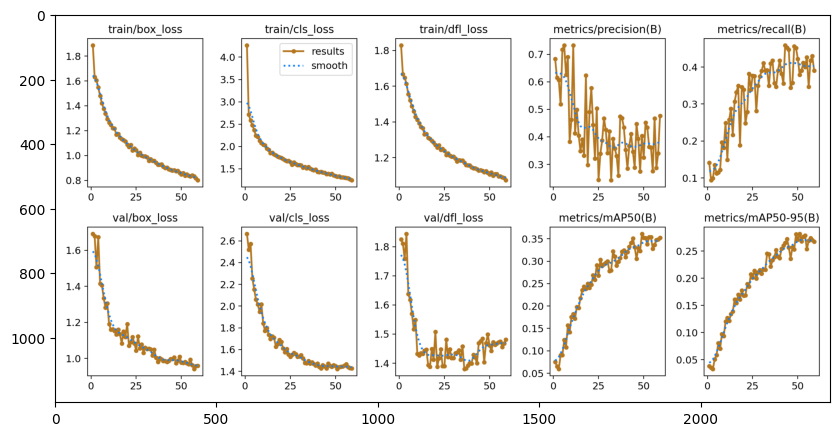

In [ ]:
import cv2
plt.figure(figsize=(10,10))
img = cv2.imread('/content/runs/detect/od/train/train/results.png')
_=plt.imshow(img)

## Confusion Matrix

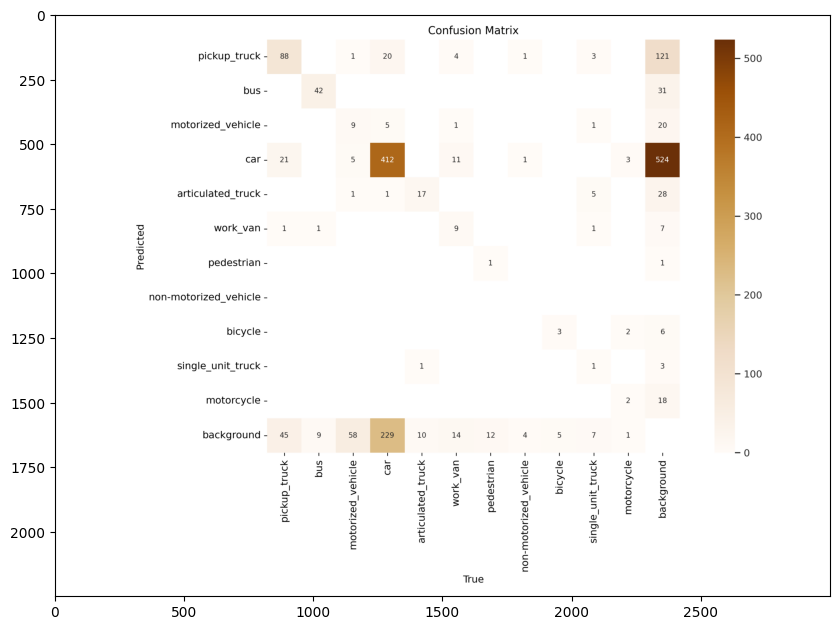

In [ ]:
plt.figure(figsize = (10,10))
img = cv2.imread('/content/runs/detect/od/train/train/confusion_matrix.png')
_=plt.imshow(img)

## Confusion Matrix Normalized

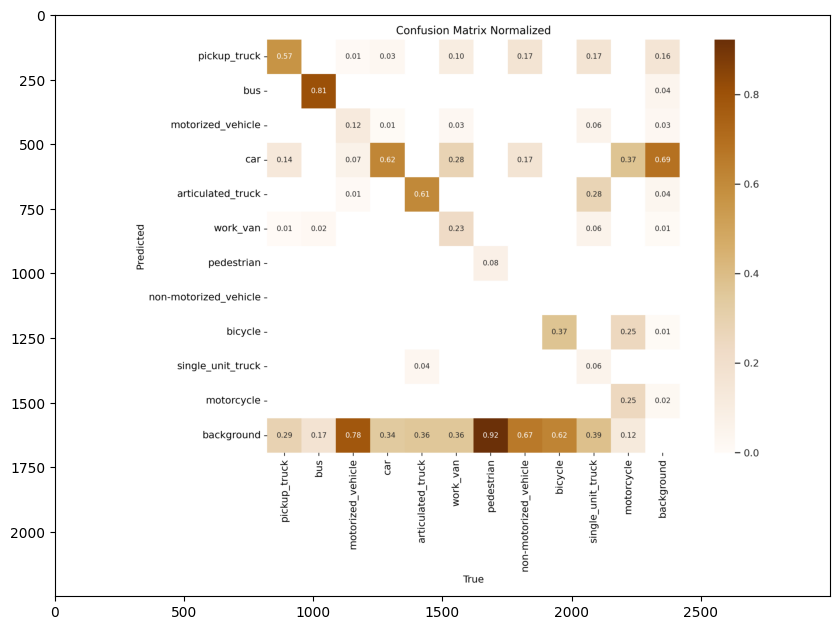

In [ ]:
plt.figure(figsize = (10,10))
img = cv2.imread('/content/runs/detect/od/train/train/confusion_matrix_normalized.png')
_=plt.imshow(img)

In [ ]:
def set_res_dir(train=True):
  res_dir_count = len(glob('runs/train/*'))
  print(f'current number of result directories : {res_dir_count}')
  if train:
    res_dir = f'results_{res_dir_count+1}'
    print(res_dir)
  else:
    res_dir = f'results_{res_dir_count}'
  return res_dir

## Derive predictions

In [ ]:

results = model.predict(test_image_path)



image 1/58 /content/datasets/test/images/00005600.jpg: 448x640 1 car, 47.4ms
image 2/58 /content/datasets/test/images/00005601.jpg: 448x640 (no detections), 11.8ms
image 3/58 /content/datasets/test/images/00005602.jpg: 448x640 1 car, 11.8ms
image 4/58 /content/datasets/test/images/00005603.jpg: 448x640 (no detections), 11.7ms
image 5/58 /content/datasets/test/images/00005604.jpg: 448x640 1 pickup_truck, 1 car, 11.7ms
image 6/58 /content/datasets/test/images/00005605.jpg: 448x640 1 pickup_truck, 1 articulated_truck, 11.7ms
image 7/58 /content/datasets/test/images/00005606.jpg: 448x640 2 cars, 11.7ms
image 8/58 /content/datasets/test/images/00005607.jpg: 448x640 2 cars, 11.7ms
image 9/58 /content/datasets/test/images/00005608.jpg: 448x640 (no detections), 10.7ms
image 10/58 /content/datasets/test/images/00005609.jpg: 448x640 1 bus, 9.9ms
image 11/58 /content/datasets/test/images/00005610.jpg: 448x640 1 car, 9.8ms
image 12/58 /content/datasets/test/images/00005611.jpg: 448x640 3 cars, 9.

In [ ]:
def plot_box(image,boxes,labels):
    h,w,_ = image.shape
    for box_num,box in enumerate(boxes):
        xyxy = box.xyxy.int().tolist()
        xmin,ymin,xmax,ymax = xyxy[0][0], xyxy[0][1],xyxy[0][2],xyxy[0][3]
        width = xmax-xmin
        height = ymax-ymin
        class_name = class_names[int(labels[box_num])]
        color = COLORS[int(labels[box_num])]
        cv2.rectangle(image,(xmin,ymin),(xmax,ymax),color,5)
        font_scale = min(1,max(3,int(w/500)))
        font_thickness = 5#min(2,max(10,int(w/50)))
        font = cv2.FONT_HERSHEY_SIMPLEX
        # p1,p1 = (int(xmin+1.5*width),ymin), (int(xmin+width),ymin-int(1.5*height))
        text_width = cv2.getTextSize(class_name,font,font_scale,font_thickness)[0][0]
        text_height = cv2.getTextSize(class_name,font,font_scale,font_thickness)[0][1]
        cv2.putText(image,class_name,(xmin,ymin+20),font,font_scale,color,font_thickness)
    return image


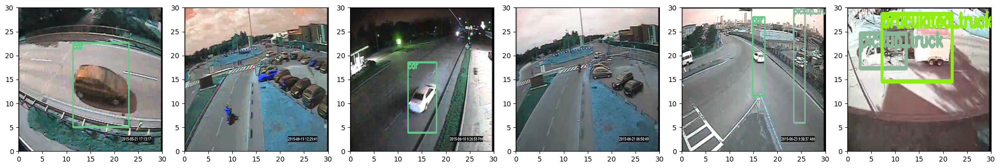

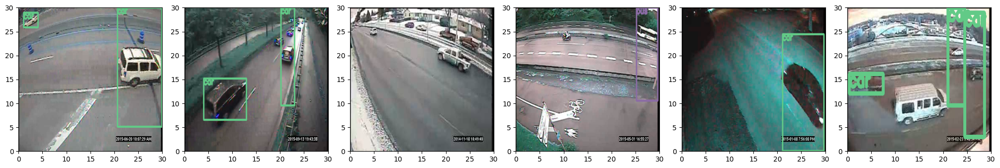

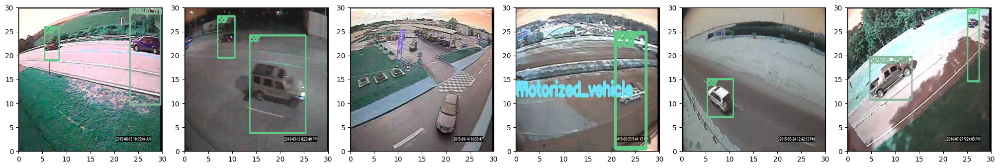

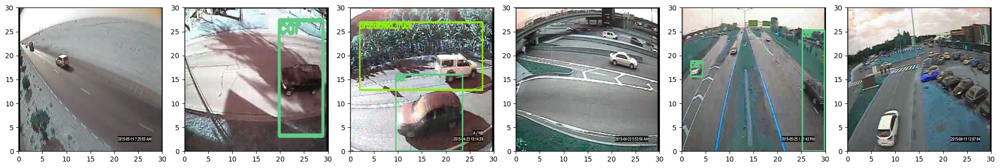

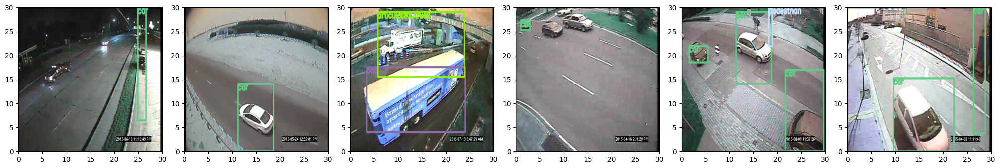

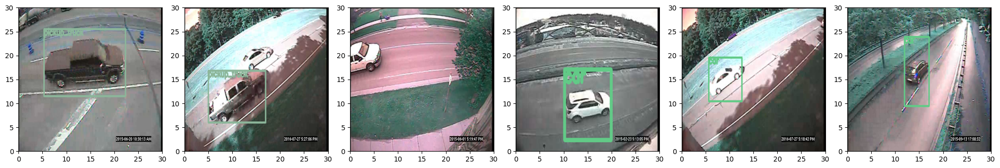

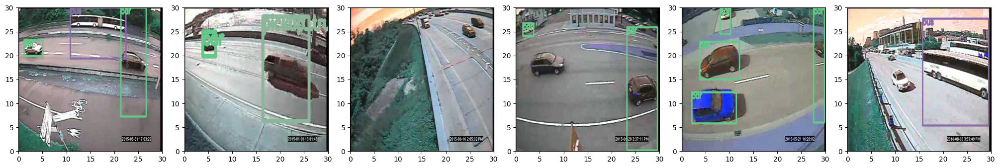

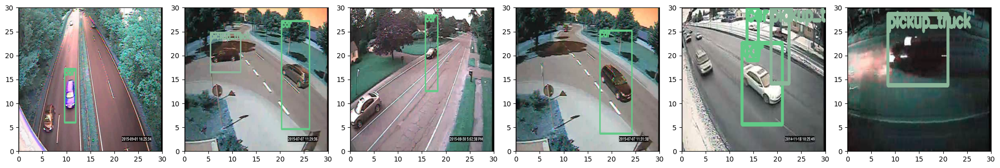

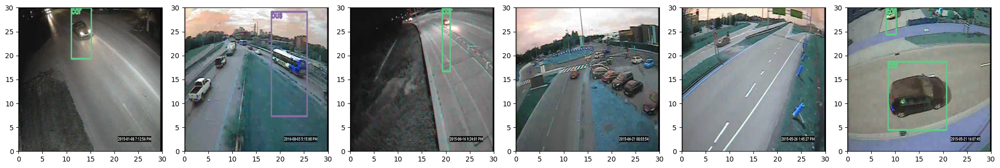

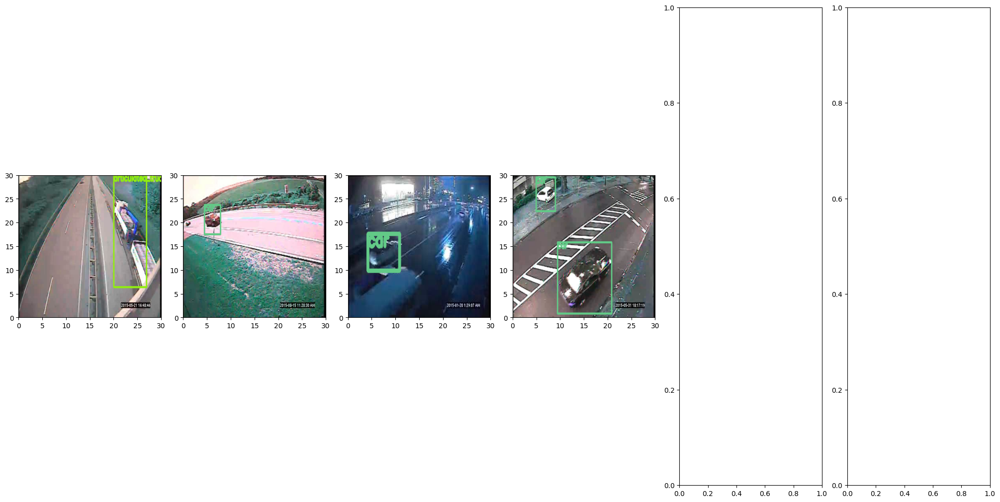

In [ ]:

COLORS = np.random.uniform(0,255,size=(len(class_names),3))
sixes = []
count = 0
d = list()

for j,res in enumerate(results):
    d.append(res)
    if len(d) == 6:
      sixes.append(d)
      d = list()
lst = []
for i in range(len(sixes)*6,len(results)):
  lst.append(results[i])
sixes.append(lst)


for i in (range(len(sixes))):
  fig,axes = plt.subplots(nrows=1,ncols=6,figsize=(20,10),constrained_layout=True)
  results_ = sixes[i]
  for j in range(len(results_)):
    res = results_[j]
    image = res.orig_img
    boxes = res.boxes  # Boxes object containing bounding box information
    confidences = boxes.conf  # Confidence scores
    classes = boxes.cls
    box_img = plot_box(image,boxes,classes)
    axes[j].imshow(box_img, extent=[0, 30, 0, 30])

